#### @author: Shikhar_Goyal

### Importing pandas and numpy libraries

In [1]:
import pandas as pd
import numpy as np

### Reading dataset

##### **Please note than I have used bank-additional-full dataset as it had more columns than bank-full dataset. I thought of merging both the dataframes but due to abscence of primary key I was unable to merge. Also, appending 1 dataset below other won't work as the column names are different like in bank-additional-full dataset we have day_of_week column but in bank-full dataset we have day column so we can't directly append 1 dataframe to other. Hence, assuming that bank-additional-full dataset has complete updated information, I decided to proceed for EDA using the additional dataset**

In [2]:
df_additional_full = pd.read_csv('/Users/shikhargoyal/Documents/P/bank+marketing/bank-additional/bank-additional-full.csv',sep = ';')
df_additional_full.head() # Displaying first few rows of the dataset

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


#### Data Dictionary
Input variables:
   ###### bank client data:
   ###### 1 - age (numeric)
   
   ###### 2 - job : type of job (categorical: "admin.","blue-collar","entrepreneur","housemaid","management","retired","self-employed","services","student","technician","unemployed","unknown")
   
   ###### 3 - marital : marital status (categorical: "divorced","married","single","unknown"; note: "divorced" means divorced or widowed)
   
   ###### 4 - education (categorical: 
  "basic.4y","basic.6y","basic.9y","high.school","illiterate","professional.course","university.degree","unknown")
  
   ###### 5 - default: has credit in default? (categorical: "no","yes","unknown")
   
   ###### 6 - housing: has housing loan? (categorical: "no","yes","unknown")
   
   ###### 7 - loan: has personal loan? (categorical: "no","yes","unknown")
   
   ###### related with the last contact of the current campaign:
   ###### 8 - contact: contact communication type (categorical: "cellular","telephone") 
   
   ###### 9 - month: last contact month of year (categorical: "jan", "feb", "mar", ..., "nov", "dec")
   
  ###### 10 - day_of_week: last contact day of the week (categorical: "mon","tue","wed","thu","fri")
  
  ###### 11 - duration: last contact duration, in seconds (numeric). Important note:  this attribute highly affects the output target (e.g., if duration=0 then y="no"). Yet, the duration is not known before a call is performed. Also, after the end of the call y is obviously known. Thus, this input should only be included for benchmark purposes and should be discarded if the intention is to have a realistic predictive model.
  
   ###### other attributes:
   
  ###### 12 - campaign: number of contacts performed during this campaign and for this client (numeric, includes last contact)
  
  ###### 13 - pdays: number of days that passed by after the client was last contacted from a previous campaign (numeric; 999 means client was not previously contacted)
  
  ###### 14 - previous: number of contacts performed before this campaign and for this client (numeric)
  
  ###### 15 - poutcome: outcome of the previous marketing campaign (categorical: "failure","nonexistent","success")
  
   ###### social and economic context attributes
   
  ###### 16 - emp.var.rate: employment variation rate - quarterly indicator (numeric)
  
  ###### 17 - cons.price.idx: consumer price index - monthly indicator (numeric)
  
  ###### 18 - cons.conf.idx: consumer confidence index - monthly indicator (numeric)  
  
  ###### 19 - euribor3m: euribor 3 month rate - daily indicator (numeric)
  
  ###### 20 - nr.employed: number of employees - quarterly indicator (numeric)

 ######  Output variable (desired target):
 
  ###### 21 - y - has the client subscribed a term deposit? (binary: "yes","no")

### Checking shape of dataset and merging X and y dataframes into 1 single dataframe df1

In [3]:
df_additional_full.shape #checking the no. or rows and columns in the datset using shape command

(41188, 21)

### Combining 2 dataframes X and y to make a complete dataset

###### Making a copy of df_additional_full in df_copy so that we don't do any unecessary transformations in original dataframe and also if needed we can revert back to oriignal dataframe


In [4]:
df_copy = df_additional_full.copy()
df_copy.shape                      #checking shape of the dataset to ensure all the rows and columns are copied

(41188, 21)

### Exploratory Data Analysis (EDA)

###### Pandas Profiling is a library that generates a detailed report, including descriptive statistics, missing values analysis, correlations, and variable distributions

In [5]:
!pip install pandas-profiling #installing pandas-profiling library

In [6]:
from pandas_profiling import ProfileReport

profile = ProfileReport(df_copy, title='Bank_Marketing_Dataset_PandasProfiling_Report', explorative=True) #Generate a profiling report for the dataset

profile.to_notebook_iframe()  # Display the report in JupyterNotebook 


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### Instead of using df.info() and df.describe(),I have used pandas profiling which is automated way of doing EDA
#### Barplots, histogram, pie charts for all the variables are already plotted with the help of profiling
#### We noticed that the data type for each of the column is correctly classified so not changing the data type for any column

### Basic Observations about shape of the data from pandas profiling report:
1.) Total no. of rows in the dataset 41188 

2.) Total number of variables - 21 (10 Numeric, 10 Categorical, 1 Boolean) 

3.) 12 duplicate rows in the dataset 

4.) If we toggle to "Missing Values" tab then we can see that no column is having missing values

### Observations (recorded by seeing the plots plotted against each variable):
1.) Most of the customers are having an admin related job

2.) Most of the customers are married

3.) Most of the customers are having a university degree

4.) Most of the customers have no credit default in the past

In [7]:
# renaming the target variable to 'Result' for non technical stakeholders to understand the target variable better
df_copy.rename(columns = {'y':'Result'},inplace=True)

In [8]:
# recoding the target variable to binary
df_copy['Result'].replace({'yes':1,'no':0},inplace=True)

In [9]:
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

### Dropping duplicate rows as they might give us wrong results

In [10]:
# View duplicate rows
duplicates = df_copy[df_copy.duplicated()]

# Display duplicate rows
print(duplicates)

       age          job   marital            education  default housing loan  \
1266    39  blue-collar   married             basic.6y       no      no   no   
12261   36      retired   married              unknown       no      no   no   
14234   27   technician    single  professional.course       no      no   no   
16956   47   technician  divorced          high.school       no     yes   no   
18465   32   technician    single  professional.course       no     yes   no   
20216   55     services   married          high.school  unknown      no   no   
20534   41   technician   married  professional.course       no     yes   no   
25217   39       admin.   married    university.degree       no      no   no   
28477   24     services    single          high.school       no     yes   no   
32516   35       admin.   married    university.degree       no     yes   no   
36951   45       admin.   married    university.degree       no      no   no   
38281   71      retired    single    uni

In [11]:
# Drop duplicate rows (keeping the first occurrence)
df3 = df_copy.drop_duplicates()

# Verify that duplicates are dropped
print(df3)

       age          job  marital            education  default housing loan  \
0       56    housemaid  married             basic.4y       no      no   no   
1       57     services  married          high.school  unknown      no   no   
2       37     services  married          high.school       no     yes   no   
3       40       admin.  married             basic.6y       no      no   no   
4       56     services  married          high.school       no      no  yes   
...    ...          ...      ...                  ...      ...     ...  ...   
41183   73      retired  married  professional.course       no     yes   no   
41184   46  blue-collar  married  professional.course       no      no   no   
41185   56      retired  married    university.degree       no     yes   no   
41186   44   technician  married  professional.course       no      no   no   
41187   74      retired  married  professional.course       no     yes   no   

         contact month day_of_week  ...  campaign  

### Doing Bivariate analysis

In [12]:
%matplotlib inline

import matplotlib.pyplot as plt
import seaborn as sns

<AxesSubplot:xlabel='job', ylabel='count'>

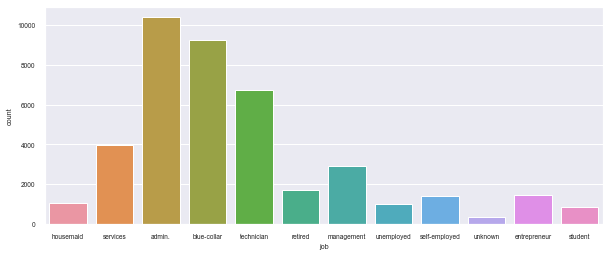

In [13]:
sns.set(font_scale=0.6)  # set font size
plt.figure(figsize=(10, 4)) # set figure size
sns.countplot(x='job',data=df3)

### Dropping rows in which columns are having unknown values (unkown values < 5% in a column)

In [14]:
# There is a value named "unknown" which can be considered as potential missing values. so rows with value 'unknown' are being dropped.
df3 = df3.drop(df3[df3['job']=='unknown'].index)

In [15]:
# There is a value named "unknown" which can be considered as potential missing values. so rows with value 'unknown' are being dropped.
df3 = df3.drop(df3[df3['marital']=='unknown'].index)

In [16]:
# There is a value named "unknown" which can be considered as potential missing values. so rows with value 'unknown' are being dropped.
df3 = df3.drop(df3[df3['education']=='unknown'].index)

In [17]:
# column default has 8597 rows with value 'unknown' and 3 rows with value 'yes'.
# if we remove the rows with 'unknown', practically there will be only one constant significant value 'no'. so better to drop the column.
df3.drop('default',axis=1,inplace=True)

In [18]:
# There is a value named "unknown" which can be considered as potential missing values. so rows with value 'unknown' are being dropped.
df3 = df3.drop(df3[df3['housing']=='unknown'].index)

In [19]:
# There is a value named "unknown" which can be considered as potential missing values. so rows with value 'unknown' are being dropped.
df3 = df3.drop(df3[df3['loan']=='unknown'].index)

### Column Transformation - Forming bins for better readability

In [20]:
# Recoding the Age column from continuous to categorical
bins = [0, 20, 30, 40, 50, 60, 70, 80, 100] # define the age bins

# define the bin labels
labels = ['0-20', '20-30', '30-40', '40-50', '50-60', '60-70', '70-80', '80-100']

# bin the Age column and create a new column 'Age Binned'
df3['Age_Binned'] = pd.cut(df3['age'], bins=bins, labels=labels, include_lowest=True)

In [21]:
# checkign if bins have been created or not
df3[['age','Age_Binned']]

,age,Age_Binned
0,56,50-60
1,57,50-60
2,37,30-40
3,40,30-40
4,56,50-60
...,...,...
41183,73,70-80
41184,46,40-50
41185,56,50-60
41186,44,40-50


In [22]:
df3['Age_Binned']=df3['Age_Binned'].astype('object') #changing the data type of the column to categorical
# dropping age column as we have already created bins
df3.drop('age',axis=1,inplace=True)

#### Reindexing the columns

In [23]:
new_order = ['Age_Binned','job', 'marital', 'education', 'housing', 'loan', 'contact', 'month',
       'day_of_week', 'duration', 'campaign', 'pdays', 'previous', 'poutcome',
       'emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m',
       'nr.employed', 'Result']
df3 = df3.reindex(columns=new_order)
df3

,Age_Binned,job,marital,education,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,Result
0,50-60,housemaid,married,basic.4y,no,no,telephone,may,mon,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0
1,50-60,services,married,high.school,no,no,telephone,may,mon,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0
2,30-40,services,married,high.school,yes,no,telephone,may,mon,226,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0
3,30-40,admin.,married,basic.6y,no,no,telephone,may,mon,151,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0
4,50-60,services,married,high.school,no,yes,telephone,may,mon,307,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,70-80,retired,married,professional.course,yes,no,cellular,nov,fri,334,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,1
41184,40-50,blue-collar,married,professional.course,no,no,cellular,nov,fri,383,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,0
41185,50-60,retired,married,university.degree,yes,no,cellular,nov,fri,189,2,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,0
41186,40-50,technician,married,professional.course,no,no,cellular,nov,fri,442,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,1


In [24]:
from pandas_profiling import ProfileReport

profile = ProfileReport(df3, title='Updated_Bank_Marketing_Dataset_PandasProfiling_Report', explorative=True) #Generate a profiling report for the dataset

profile.to_notebook_iframe()  # Display the report in JupyterNotebook 

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

##### No duplicate rows and unknown values in the columns for which we have removed in above ateps

### Data Visualization

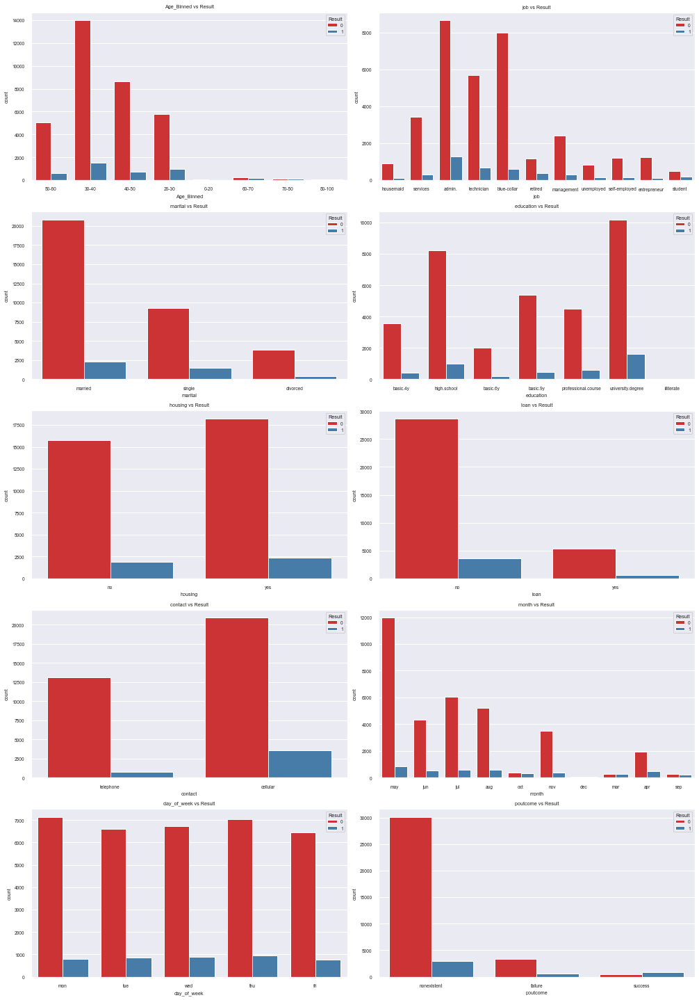

In [25]:
categorical_cols = df3.select_dtypes(include=['object']).columns

# Loop through each categorical column and create a countplot subplot
plt.figure(figsize=(14, 20)) 
for i, col in enumerate(categorical_cols, 1):
    plt.subplot(5, 2, i)  # Set position for each plot
    sns.countplot(x=col, hue='Result', data=df3, palette='Set1')  # Replace 'Result' with the actual target column name
    plt.title(f'{col} vs Result')  # Set plot title
    
    # Rotate the x-axis labels by 90 degrees
    plt.xticks(rotation=0)

# Adjust layout for better spacing
plt.tight_layout()

### Insights:

1.) Customers who are contacted through telephone are more likely (~3 times higher) to enroll for term deposit.

2.) Customers when contacted in the months May, Jun,jul and aug have less probability to enroll for the term deposit as we can see that number of calls made is maximum in may, jun, jul aug but the conversion rate is very low.

3.) Customers with age above 50 are more likely to enroll for the term deposit as we can see that there is low churn rate in that 50+ age group. If we see age group 30-40 even though more customers are taking term deposit but the converison rate  is very low.

4.) Customers with job type as housemaid & entrepreneur are less likely to enroll for term deposit

5.) Customers who are enrolled during the previous campaign are more likely to enroll again for the term deposit.

### Exporting the cleaned dataset

###### Capitalizing the first word of categorical columns for better readability

In [26]:
categorical_cols = df3.select_dtypes(include=['object']).columns
categorical_cols 

Index(['Age_Binned', 'job', 'marital', 'education', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'poutcome'],
      dtype='object')

In [27]:
# creating a function to capitalize the first word
def capital_first_word(text):
    words = text.split()     
    if len(words) > 0:
        words[0] = words[0].capitalize()  # Capitalize the first word
    return ' '.join(words)                # Join the words back into a string

# List of columns to apply the function
columns_to_capitalize = ['Age_Binned', 'job', 'marital', 'education', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'poutcome']

# Apply the function to the specified columns
df3[columns_to_capitalize] = df3[columns_to_capitalize].applymap(lambda x: capital_first_word(x) if isinstance(x, str) else x)

# Show the updated DataFrame
df3.head()


,Age_Binned,job,marital,education,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,Result
0,50-60,Housemaid,Married,Basic.4y,No,No,Telephone,May,Mon,261,1,999,0,Nonexistent,1.1,93.994,-36.4,4.857,5191.0,0
1,50-60,Services,Married,High.school,No,No,Telephone,May,Mon,149,1,999,0,Nonexistent,1.1,93.994,-36.4,4.857,5191.0,0
2,30-40,Services,Married,High.school,Yes,No,Telephone,May,Mon,226,1,999,0,Nonexistent,1.1,93.994,-36.4,4.857,5191.0,0
3,30-40,Admin.,Married,Basic.6y,No,No,Telephone,May,Mon,151,1,999,0,Nonexistent,1.1,93.994,-36.4,4.857,5191.0,0
4,50-60,Services,Married,High.school,No,Yes,Telephone,May,Mon,307,1,999,0,Nonexistent,1.1,93.994,-36.4,4.857,5191.0,0


In [28]:
df3.to_csv('/Users/shikhargoyal/Documents/P/df3_final_cleaned.csv', index=False)

# ********************** END **********************